# Eruptio

# Introduction

Le volcanisme représente un assemblage de phénomènes naturels associés aux activités de chacun des volcans à travers le monde. Au cours de l'histoire nombreuses ont été les évènements volcaniques, où leurs intensités varient selon certaines conditions et certains processus, tels que la source de déclenchement pouvant être un dégazage important ou un tremblement de terre.

Ce programme a pour objectif une meilleure compréhension des activités volcaniques selon le contexte géodynamique agissant sur le type de magmatisme et de volcanisme.

La première étape consiste à l'importation des bibliothèques afin d'initialiser les composantes qui serviront au cours du programme.

Consigne importante : Pour que le code puisse fonctionner correctement, il est nécessaire de lancer chaque cellule, l'une après l'autre au cours de l'avancement.

In [8]:
#import des bibliothèques nécéssaire
import folium
import pandas as pd
%pwd
import ipywidgets as widgets
from ipywidgets import interact, interactive
from ipywidgets import *
import numpy as np
import matplotlib.pyplot as plt
import bqplot as bq
import random 
import statistics 
import math
import unittest
import random
import scipy.stats as stats
from scipy.stats import poisson
#_________________________________________________ 

# Initialisation de la carte

Afin d'obtenir une meilleure compréhension des activités volcaniques à l'échelle mondiale, la mise en place d'une carte servant à la visualisation des données est nécessaire. Pour cela, lancez la cellule ci-dessous. 

Cette dernière initialise la carte et positionne les volcans à partir d'un base de données prélevée d'une institut spécialisé dans le volcanisme. De plus, une définition permet l'affichage de la densité de population pour chaque pays et les frontières entre les différentes limites de plaques. 

Les volcans seront représentés sous la forme d'un îcone volcanique sur la carte.

Pour plus de renseignement sur l'institution, cliquez sur le lien : https://volcano.si.edu/

In [9]:
#création de la carte(pour quelles oit affiché des le debut et que ca ne pose pas de probleme lors du tri des volcans)
#_________________________________________________ 
# Création d'une carte leaflet
volcano_map = folium.Map(location = [0.0, 0.0], zoom_start = 2, tiles = "Stamen Terrain")

#_________________________________________________
# Lire le fichier de données excel
volcanoes = pd.read_excel("Liste_volcans.xlsx")

#________________________________________________
#création des marqueurs

volcano_map.add_child(folium.LatLngPopup()) # Affichage des coordonnées géographiques quand on clique sur la carte

# Boucle pour placer les marqueurs des volcans
for _, volcano in volcanoes.iterrows(): # .iterrows() permet de faire une itération sur des trames de données de la bibliothèque pandas
    # Chargement d'une icône à partir d'une url servant de marqueur
    elpopup=folium.IFrame('Nom du volcan: ' + volcano['VolcanoName'] + '<br>' + 
                          'Pays: '+ volcano['Country']+'<br>' + 
                          'Type de roche :'+ str(volcano['Dominant Rock Type'])+'<br>' +
                          'Type de volcan :'+ volcano['Primary Volcano Type']+'<br>' + 
                          'Type de volcanisme :'+ str(volcano['Tectonic Setting'])+'<br>' + 
                          "Dernière date d'éruption : "+ str(volcano['Last_Known_Eruption'])+'<br>' +  
                          'Altitude :'+str(volcano['Elevation (m)'])+'m')
    popup = folium.Popup(elpopup, min_width=300, max_width=300)
    iconVolcano = folium.features.CustomIcon("https://img.icons8.com/emoji/48/null/volcano-emoji.png", icon_size = (23,23))
    # Placement du marqueur sur la carte
    folium.Marker(location = [volcano["Latitude"], volcano["Longitude"]], popup =popup, tooltip = volcano['VolcanoName'], icon = iconVolcano).add_to(volcano_map)
#_________________________________________________ 
# Création d'un GeoJson overlay pour afficher la densité de population par pays

def style_function(feature):   # fonction permettant de modifier le style du GeoJSON overlay
    return {'weight': 0, 'fillOpacity': 0}

world_geo = "world-countries.json" 
countries = folium.GeoJson(world_geo, name = "world countries", style_function=style_function).add_to(volcano_map) # GeoJson overlay
folium.features.GeoJsonPopup(fields = ["name", "area", "population", "density"], labels = False).add_to(countries) # Création d'un Popup avec les informations pour chaque surface de pays 
#__________________________________________________
# Création d'un GeoJson overlay pour afficher les frontères des plaques lithosphériques

def style_function(feature):   # fonction permettant de modifier le style du GeoJSON overlay
    return {'color':'red', 'weight': 2, 'fillOpacity': 0}

plate_boundaries = "https://raw.githubusercontent.com/fraxen/tectonicplates/master/GeoJSON/PB2002_boundaries.json"
plaques = folium.GeoJson(plate_boundaries, name = "Limites des plaques Lithosphériques", style_function = style_function).add_to(volcano_map) # GeoJson overlay avec modification de la couleur 
#__________________________________________________

# Création de widgets

L'étape suivante comprend la création des widgets. Ils représentent de petites parties permettant la saisie de données par l'utilisateur et qui peuvent prendre la forme d'un curseur, une zone de texte...

- Le premier widget est de type slider, il consiste à positionner les curseurs sur l'intervalle d'altitude souhaité.

- Le deuxième, de même type, filtre les âges d'éruption. C'est-à-dire les dernières éruptions produites dans l'intervalle de temps indiqué. 

- Pour trier le type de volcanisme un bouton est créé, il suffit simplement de cocher les cases pour le volcanisme voulu.

- Un widget affichant ou non les séismes, les limites de plaques et les volcans. 
Les séismes seront illustrés sous la forme de points bleus.

Concernant l'utilisation, même principe que précédemment, le cochage ou décochage de la case selon les données à représenter.
Il est possible de masquer les volcans avec une date d'éruption inconnue en cochant la case correspondant à cette option "Masquer les volcans avec une date d'éruption inconnue". 

Consigne : Le choix des données pour chacun des filtres se fera lorsque vous aurez lancé l'intégralité des cellules du programme.

In [15]:
#Création des widgets
#__________________________________________________
# Creation d'un slider pour choisir l'altitude des volcans
#on défini d'abord les paramètres du widget
range_layout = widgets.Layout(
    display='flex',
    flex_flow='row',
    height='30px',
    width='530px'
)
#on crée le wodget avec les paramètres précédents
slideralt = widgets.IntRangeSlider(description="Intervalle d'altitude choisi :",min=0,max=10000,value=(0,10000),style={'description_width': 'initial'},orientation='horizontal',layout=range_layout)
#__________________________________________________
#création du slider pour filtrer les âges d'éruption des volcans 

sliderage = widgets.IntRangeSlider(description="Intervalle d'âge d'éruption choisi :", min=-10000,max=2023,value=(-10000,2023),style={'description_width': 'initial'},orientation='horizontal',layout=range_layout)
boutonincertain=widgets.Checkbox(value=False,description="Masquer les volcans avec une date d'éruption inconnue",disabled=False,indent=False)
namesage=("intervalle d'éruption",'Masquer les éruptions inconnues')
agewidg = widgets.Accordion(children=[sliderage,boutonincertain])
[agewidg.set_title(i, title) for i, title in enumerate(namesage)]

#__________________________________________________
#création des boutons pour filtrer les types de volcanismes
riftbout=widgets.Checkbox(value=True,description='Rift',disabled=False,indent=False)
intraplaquebout=widgets.Checkbox(value=True,description='intra-plaque',disabled=False,indent=False)
fsubdbout=widgets.Checkbox(value=True,description='Zone de subduction',disabled=False,indent=False)
widgfiltretypevolcanisme=widgets.Box([riftbout,intraplaquebout,fsubdbout])

#_________________________________________________
#on vas afficher ou non les zones sismiques sur la cartes
seismesbout=widgets.Checkbox(value=True,description='Afficher les séismes',disabled=False,indent=False)
seisme = pd.read_csv("all_month.csv")

Crd = seisme.loc[:,["latitude", "longitude","mag"]]
for i in range(len(Crd)):
  folium.CircleMarker([Crd.latitude[i], Crd.longitude[i]], tooltip = Crd.mag[i],color = 'blue', radius = 1).add_to(volcano_map)
#__________________________________________________
layoutaide= widgets.Layout(
    display='flex',
    flex_flow='row',
    height='auto',
    width='auto',)

aide=widgets.Textarea(
    value=f"Ce code a été réalisé pour un projet dans le cadre universitaire, Si vous avez besoin d'aide ou de renseignements n'hésitez pas à nous contacter aux adresses e-mails suivantes: sari.selim@outlook.fr, au.lechner@laposte.net, gregoryhirli@gmail.com, bernhard.neumann123@gmail.com ",
    placeholder='Type something',
    disabled=False,
    layout=layoutaide,
)
#__________________________________________________
# Création d'un bouton pour afficher et appliquer l'altitude des volcans

button_layout = widgets.Layout(width='130px')

boutonalt = widgets.Button(
    description='Afficher',
    button_style='', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='afficher une nouvelle carte',
    layout=button_layout
)
#__________________________________________________
#bouton pour afficher ou non les limites de plaques
limiteplaquebout=widgets.Checkbox(value=True,description='Afficher les limites de plaques',disabled=False,indent=False)
volaffbout=widgets.Checkbox(value=True,description='Afficher les volcans',disabled=False,indent=False)
Optioncarte=widgets.Box([limiteplaquebout,seismesbout,volaffbout])


#__________________________________________________

# Dégâts occasionnés 

Une option supplémentaire est disponible sur les dégâts causés pour chaque volcan. Pour son utilisation, veuillez entrer le nom du volcan souhaité en anglais. Puis cliquez sur "Entrer" (en vert). Le résultat s'affichera, indiquant l'historique d'éruptions, ainsi que les morts et les dégâts matériels.

- Si vous rencontrez un problème de type : "Ce volcan n'existe pas vérifiez les valeurs". Veillez à bien vérifier l'ortographe du nom du volcan.

- Si le message d'erreur s'affiche, il est également possible que les données sur le volcan en question n'ont pas été trouvées ou même qu'il n'existe pas d'étude faite sur ce sujet.

Fonctionnement du code : Lorsque le nom est entré, il est immédiatement vérifié dans la base de données. S'il est présent le programme calculera et affichera les dégâts engendrés par ce volcan. Si non, le message d'erreur vu précedemment sera indiqué. 

In [11]:
#__________________________________________________
#code pour permettre de rechercher les degats causé par un volcan
taillefenetredegat = widgets.Layout(
    display='flex',
    flex_flow='row',
    height='30px',
    width='800px'
)

boxdegat=widgets.Textarea(
    value="Etna", placeholder='Type something',description="Entrez le nom d'un volcan",disabled=False)
resultatdegat=widgets.Text(
    value="Le résultat va s'afficher ici",
    placeholder='Type something',
    disabled=False,
    layout=taillefenetredegat)
boutondegat=widgets.Button(description='Entrer',button_style='success')

# charger le fichier Excel en utilisant pandas
deg = pd.read_excel("significant-volcanic-eruption-database-2.xlsx")
    
def arretdegat():
    resultatdegat.value=f"Ce volcan n'existe pas vérifiez les valeurs"
    return
    
def degatvolcan():
    deg = pd.read_excel("significant-volcanic-eruption-database-2.xlsx")

    # filtrer les données pour n'afficher que les lignes correspondantes au nom du volcan donné
    volcano_data = deg[deg["Volcano Name"] == boxdegat.value]

    # calculer le nombre total de morts causées par le volcan
    total_morts = volcano_data["Total Effects : Deaths"].sum()

    # calcul les dégats causé par le volcan
    total_domage = volcano_data["Volcano : Damage (in M$)"].sum()

    # calculer le nombre total d'éruptions du volcan
    total_eruptions = volcano_data.shape[0]

    # affiche le résultat des dégat le résultat des morts et le nombre d'éruptions
    resultatdegat.value=f'Au total dans son existance le volcan {boxdegat.value} a causé {total_morts} mort(s) et {total_domage} millions de dollars de dommage . Pour {total_eruptions} éruption(s)'
    return 

def vérifnom(event):
    deg = pd.read_excel("significant-volcanic-eruption-database-2.xlsx")
    z1 = deg.index[deg['Volcano Name'] == boxdegat.value]# Numéro du volcan correspondant au volcan recherché
    if (len(z1)==0):
        arretdegat()
    else:
        degatvolcan()
boutondegat.on_click(vérifnom)
    
rechdeg=widgets.Box([boxdegat,boutondegat,resultatdegat])
#__________________________________________________

# Probabilités

Dans la partie suivante, la notion de probabilité sera abordée. 

Le programme ci-dessous calcule dans un premier lieu le temps de retour, qui correspond au temps moyen entre chaque éruption. Ensuite le calcul de probabilité à partir de la loi de Poisson s'effectue. Cette loi démontre le comportement d'un certain nombre d'évènements se déroulant dans une période donné.

Un widget a été crée afin de pouvoir renseigner les valeurs que vous désirez calculer.

Conseils d'utilisation : Entrez le nombre d'occurences puis la période de temps sur laquelle la probabilité doit être calculer. Appuyer sur afficher.

Si un message d'erreur a lieu et que la probabilité n'a pas été calculée, comme pour les dégâts, pensez à vérifier l'orthographe. 
Le message affichant "Ce volcan n'a pas de donnée, veuillez en choisir un autre" indique qu'il n'y a pas de données repertoriées à ce sujet.

In [12]:
#__________________________________________________
#Partie probabilité on crée d'abord les widget opur pouvoir l'afficher dans le tableau
taillefenetreproba = widgets.Layout(
    flex_flow='column',
    height='auto',
    width='800px'
)

Proba = widgets.Output()#plt
boxProbaNom=widgets.Textarea(
    value="Vesuvius",description='Nom du volcan :', placeholder='Type something',disabled=False)
boxProbaNombre=widgets.BoundedIntText(
    value="0", placeholder='Type something',description="Combien d'éruptions ?",disabled=False,max=100000000000)
boxProbaAge=widgets.BoundedIntText(
    value="0", placeholder='Type something',description="Période de Temp",disabled=False,max=100000000000)
resultatProba=widgets.Text(
    value="Le résultat va s'afficher ici",
    placeholder='Type something',
    disabled=False,
    layout=taillefenetredegat)
boutonProba= widgets.Button(
    description='Afficher',
    button_style='', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='afficher les probabilités',
    layout=button_layout)
Probawidg=widgets.Box([boxProbaNom,boxProbaNombre,boxProbaAge,boutonProba,resultatProba,Proba],layout=taillefenetreproba)

# Lire les données de la base de données et stocker les dates dans une liste

data = pd.read_excel("Liste_Volcans.xlsx")
data2 = data.loc[:,["Historique"]]

historique_str = []
for i in range(len(data2)):   # Crée une liste de str
    historique_str.append(data2.Historique[i]) 

Historiques = []
for j in range(len(historique_str)):
    historique_str2 = historique_str[j].split(',')  # séparation de la chaîne de caractères aux virgules
    historique_list = list(map(int, historique_str2)) # Fonction build-in map transforme les str de la liste historique2 en int
    Historiques.append(historique_list)
    
# Calcul du temps de retour T
# Définition temps de retour: Temps moyen entre chaque occurence de l'évènement considéré
# historique = [202,586,1267,1578,1927]# Exemple d'historique d'éruptions
def arretproba():
    resultatProba.value=f"Ce volcan n'existe pas verifiez l'orthographe"
    return


def lancementproba(): 
    z = volcanoes.index[volcanoes['VolcanoName'] == boxProbaNom.value]# Numéro du volcan correspondant au volcan recherché
    b=z[0]
    print(b)
    durees = []
    for i in range(len(Historiques[b])):
        if i == 0:
            continue
        a = Historiques[b][i]-Historiques[b][i-1]
        durees.append(a)

    T = statistics.mean(durees)

    # Création de la fonction de Probabilité de Poisson

    def PoissonProba(k,D,T):
        P = (D/T)**k*np.exp(-D/T)*(1/math.factorial(k))
        return P
        
        
    if (volcanoes.iloc[b,13]=='0,0,0'):
        resultatProba.value=f"Ce volcan n'a pas de donnée veuillez en choisir un autre"
     
    else :
        # L'utilistaeur entre k et D
        k = int(boxProbaNombre.value)
        D = float(boxProbaAge.value)

        res = round(PoissonProba(k,D,T)*100, 4)

        resultatProba.value=f"La probabilité qu'il y a {k} éruptions en {D} ans est de {res} %."


        # Création d'une figure montrant la probabilité en fonction du nombre d'éruptions k pendant l'intervalle de temps D entré par l'utilisateur

        Probs = []
        indexes = []
        for i in range(100):  
          Proba = PoissonProba(i,D,T)
          if Proba >= 0.0001:
            Probs.append(Proba)
            indexes.append(i)
    

        plt.figure(2)
        ax = plt.gca()
        plt.bar(indexes,Probs, color='steelblue')

        mu = D/T  # Moyenne de k pendant la durée D
        x = np.arange(min(indexes),max(indexes)+1,1)
        y = poisson.pmf(x, mu, loc=0)
        plt.axis(xmin=min(indexes),xmax=max(indexes))
        plt.xticks(indexes)
        plt.title(f"Probabilité d'éruptions pour {boxProbaAge.value} années pour {boxProbaNom.value}")
        plt.xlabel(f"Nombre d'éruptions k")
        plt.ylabel("Probabilité P")
        plt.plot(x,y,color='red',linewidth=4)
        plt.show()
        return
def calculz(event):
    z = volcanoes.index[volcanoes['VolcanoName'] == boxProbaNom.value]# Numéro du volcan correspondant au volcan recherché
    if (len(z)!=0):
        lancementproba()
    else :
        arretproba()
    return(z)
    
boutonProba.on_click(calculz)
#__________________________________________________

Ce morceau de code permet la simplication de l'affichage des filtres pour une meilleure compréhension lors de l'affichage.

In [13]:
#__________________________________________________
#on vas crée un tableau pour simplifier l'affichage des widgets'
tab_filtre = widgets.Tab()
tab_filtre.children = [slideralt,agewidg,widgfiltretypevolcanisme,Probawidg,rechdeg,Optioncarte,aide]
names = ['Altitude', "Age d'éruption", 'Type de volcan','Probabilité', 'Dégâts','Option carte','Aide']
[tab_filtre.set_title(i, title) for i, title in enumerate(names)]
#__________________________________________________

[None, None, None, None, None, None, None]

# Affichage de l'interface graphique et des options

Pour cette dernière partie de programme, l'interface graphique est finalisée en prenant en compte tous les paramétrages des filtres effectués préalablement et permet l'affichage des différentes données. 

Nous pouvons afficher les différentes informations en cliquant sur un point de la carte à l'aide de "POPUP" étant une petite fenêtre sous forme d'info-bulles.

Si vous cliquez sur un pays, la population ainsi que sa densité seront indiqués.

Pour les volcans, lorsque vous cliquez sur un îcone volcanique, les informations suivantes seront affichées : Nom, pays associé, l'altitude, type de roche. Pour les séismes, en cliquant sur un des points bleus, les coordonnées GPS et la magnitude s'afficheront.

Conseil : Dès lors que vous modifiez les filtres, pensez à bien cliquer sur "Afficher" afin d'actualiser la carte. 

- Rappel : Vous rencontrez un problème ? Veuillez vérifier l'orthographe du nom. Si le problème persiste ou que vous ne savez pas quoi faire, une rubrique "Aide" est mise à disposition pour que vous puissiez nous contacter. 




Button(description='Afficher', layout=Layout(width='130px'), style=ButtonStyle(), tooltip='afficher une nouvel…

6


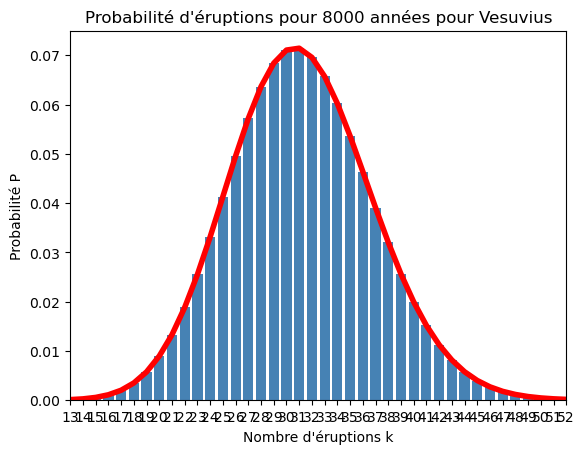

6


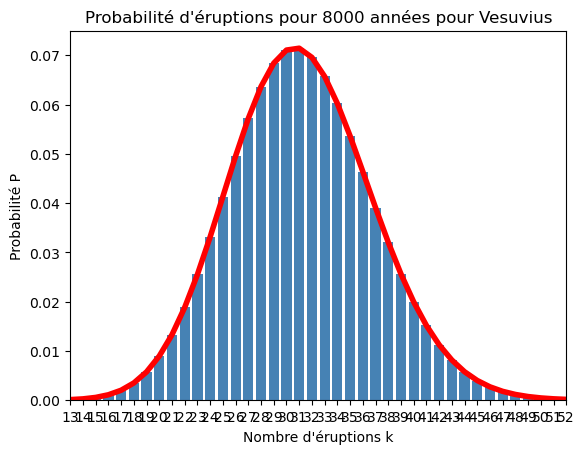

13


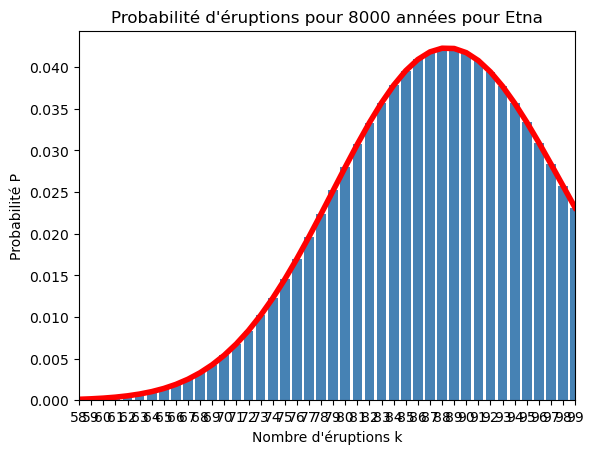

13


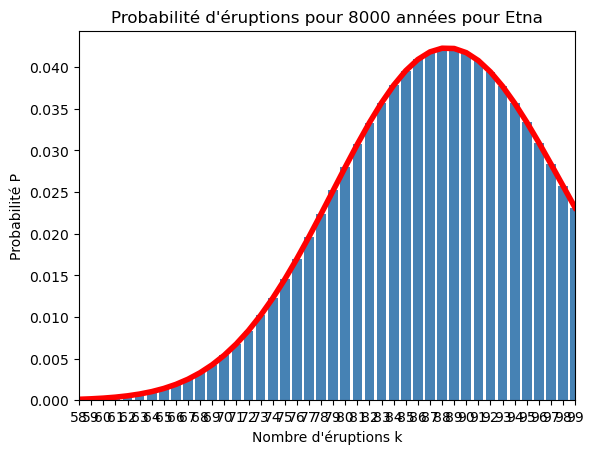

13


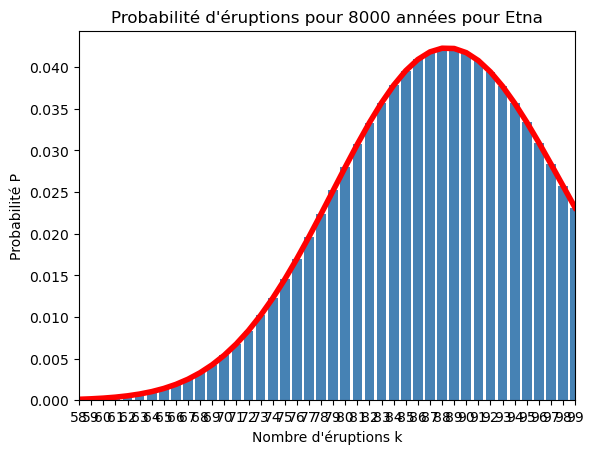

13


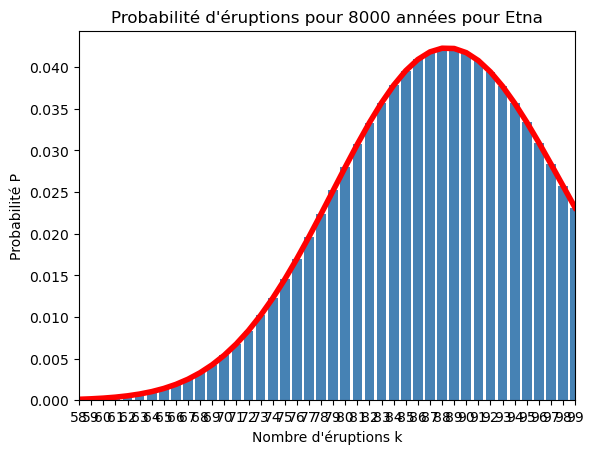

6


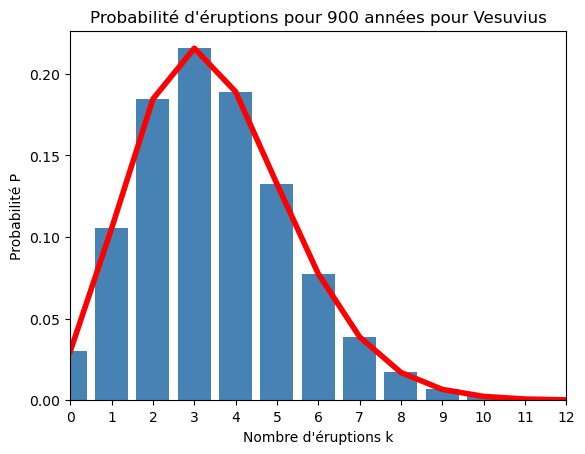

6


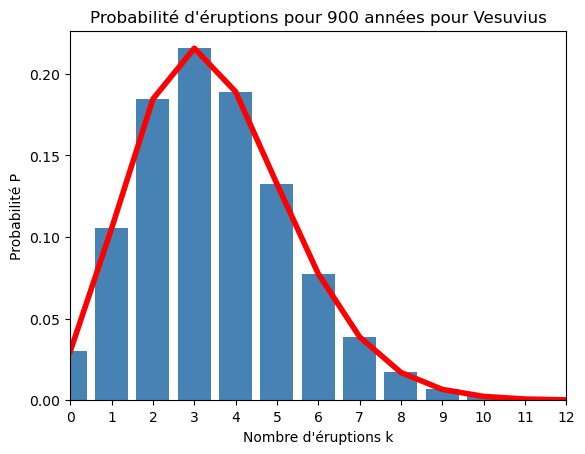

44


In [14]:
#__________________________________________________
def afficheur_alt(event):
    """
    Fonction appelé lors de l'appuie sur le bouton génerer
    """
    #Si la plage de valeur est correcte
    if(slideralt.value[0]< slideralt.value[1]):
        #________________________________________________________________________________________________________
        #on va créer des dataframes avec les valeurs d'altitude filtré
        filtre2=volcanoes[volcanoes['Elevation (m)']>slideralt.value[0]]
        filtre2=filtre2[filtre2['Elevation (m)']<slideralt.value[1]]
        #________________________________________________________________________________________________________
        #on va créer les dataframes filtré des dates d'éruptions sélectionné
        if (boutonincertain.value==True):
            filtreunknown= filtre2[filtre2['Last_Known_Eruption'] == 'Unknown']
            filtre2=filtre2.set_index("Last_Known_Eruption")
            filtre2=filtre2.drop(["Unknown"])  
            filtre2=filtre2[filtre2.index > sliderage.value[0]]
            filtre2=filtre2[filtre2.index < sliderage.value[1]]
            
        else :
            filtreunknown= filtre2[filtre2['Last_Known_Eruption'] == 'Unknown']
            filtre2=filtre2.set_index("Last_Known_Eruption")
            filtre2=filtre2.drop(["Unknown"])  
            filtre2=filtre2[filtre2.index > sliderage.value[0]]
            filtre2=filtre2[filtre2.index < sliderage.value[1]]
            filtre2.reset_index()
            filtre2=pd.concat([filtre2,filtreunknown])
            
            
            
         #_________________________________________________________________________________________________________   
        #on vas filtrer les volcans par rapport a leurs type de volcanisme
        #on trie les rift en prenant la database précédente en supprimant les valeurs avec l'indexe rift zone
        filtre2 = filtre2.set_index("Tectonic Setting")
        if (riftbout.value==False):
            filtre2 = filtre2.drop('Rift zone')
        #on fait la meme chose poyur le volcanisme intraplaque
        if (intraplaquebout.value==False):
            filtre2 = filtre2.drop('Intraplate')
        #et de meme pour la subduction
        if (fsubdbout.value==False):
            filtre2 = filtre2.drop('Subduction zone')
        #on va rétablire la database avec l'index de base    
        filtre2.reset_index()

        #_________________________________________________________________________________________________________
        #on va modifier la carte en la recréant de 0
        # Boucle pour placer les marqueurs des volcans
        volcano_map=folium.Map()
        volcano_map = folium.Map(location = [0.0, 0.0], zoom_start = 2, tiles = "Stamen Terrain")
        if (volaffbout.value==True):
            for _, volcano2 in filtre2.iterrows():
                # .iterrows() permet de faire une itération sur des trames de données de la bibliothèque pandas
                # Chargement d'une icône à partir d'une url servant de marqueur
                elpopup2=folium.IFrame('Nom du volcan: ' + volcano2['VolcanoName'] + '<br>' +
                                       'Pays: '+ volcano2['Country']+'<br>' +
                                       'Type de roche :'+ str(volcano2['Dominant Rock Type'])+'<br>' +
                                       'Type de volcan :'+ volcano2['Primary Volcano Type']+'<br>' +
                                       'Altitude :'+str(volcano2['Elevation (m)'])+'m')
                popup = folium.Popup(elpopup2, min_width=300, max_width=300)
                iconVolcano = folium.features.CustomIcon("https://img.icons8.com/emoji/48/null/volcano-emoji.png", icon_size = (23,23))
                # Placement du marqueur sur la carte
                folium.Marker(location = [volcano2["Latitude"], volcano2["Longitude"]], popup =popup, tooltip = volcano2['VolcanoName'], icon = iconVolcano).add_to(volcano_map)
        #on vas afficher ou non les seismes sur la carte si le bouton est décoché et que le bouton coché est activé
        if (seismesbout.value==True):
            Crd = seisme.loc[:,["latitude", "longitude","mag"]]
            for i in range(len(Crd)):
                folium.CircleMarker([Crd.latitude[i], Crd.longitude[i]], tooltip = Crd.mag[i],color = 'blue', radius = 1).add_to(volcano_map)
        #_________________________________________________________________________________________________________
        # Création d'un GeoJson overlay pour afficher la densité de population par pays

        def style_function(feature):   # fonction permettant de modifier le style du GeoJSON overlay
            return {'weight': 0, 'fillOpacity': 0}

        world_geo = "world-countries.json" 
        countries = folium.GeoJson(world_geo, name = "world countries", style_function=style_function).add_to(volcano_map) # GeoJson overlay
        folium.features.GeoJsonPopup(fields = ["name", "area", "population", "density"], labels = False).add_to(countries) # Création d'un Popup avec les informations pour chaque surface de pays 
        #__________________________________________________
        # Création d'un GeoJson overlay pour afficher les frontères des plaques lithosphériques

        if (limiteplaquebout.value==True):
            def style_function(feature):   # fonction permettant de modifier le style du GeoJSON overlay
                return {'color':'red', 'weight': 2, 'fillOpacity': 0}

            plate_boundaries = "https://raw.githubusercontent.com/fraxen/tectonicplates/master/GeoJSON/PB2002_boundaries.json"
            plaques = folium.GeoJson(plate_boundaries, name = "Limites des plaques Lithosphériques", style_function = style_function).add_to(volcano_map) # GeoJson overlay avec modification de la couleur 

        #_________________________________________________________________________________________________________
        # met a jour le bouton
        boutonalt.button_style = 'success'
        boutonalt.icon = 'check'
        display(volcano_map)
    
    else:
        # met a jour le bouton si la plage sélectionner est correcte
        boutonalt.button_style = 'danger'
        boutonalt.icon = ''
  
#Action lors de l'appuie sur le bouton lance la def afficheur altitude 
boutonalt.on_click(afficheur_alt)

#affichage de l'interface
display(tab_filtre)
display(boutonalt)
display(volcano_map)
#__________________________________________________


# Termes scientifiques

Volcan : Il s’agit d’une montagne formée par une activité magmatique qui peut émettre de la lave en fusion, gaz, cendres.    

Exposition : Il s’agit de la situation des infrastructures, de la population, ainsi qu’aux aptitudes de production et tous autres biens localisés dans une zone dite à risque.

Vulnérabilité : C’est l’évaluation par les facteurs sociaux, physiques, économiques et environnementaux qui influencent la susceptibilité d’un groupe d’individus ou bien d’un système aux conséquences des risques. 

Magmatisme Tholéiitique : Il s’agit d’une série magmatique peu différenciée par la cristallisation fractionnée primitif. Il définit des zones dites de dorsales océaniques, ainsi que d’arc océanique s’illustrant par une subduction.

Magmatisme Calco-alcalin : Il s’agit d’une série magmatique présentant une différenciation importante. Cette dernière est spécifique des zones de subduction.

Magmatisme Alcalin : C’est une série magmatique riche en éléments alcalins, à savoir riche en Sodium et en potassium et fortement appauvrie en silice. Il est caractérisé par le magmatisme intraplaque, autrement dit par les points chauds.

Loi de Poisson : Il s’agit d’une loi de probabilité prenant comme variable le temps de retour d’un événement considéré comme constant dans le temps. Cette distribution donne une probabilité approximative pour un nombre entier d’événements k sur une durée D.

Éruption importante : Une éruption est considérée comme importante si elle a causé la perte de vies humaines, des dommages matériels modérés ou si elle a engendré des séismes ou un tsunami. De plus, elle est classée dans cette catégorie si elle est évaluée au niveau 6 ou supérieur sur l’échelle VEI.

Rift : Un rift constitue une région d'amincissement de la croûte en formant un fossé d'effondrement sous l'effet de contraintes, comme des forces extensives ou généralement la remontée d'un point chaud.

Zone de subduction : Elle représente une zone qu'on appelle les marges actives. Ce sont des limites de plaques, où la croûte océanique plonge sous la croûte continentale par effet de densité.

Limites de plaques : Le point de rencontre entre deux plaques tectoniques, souvent associé aux activités géologiques tels que des séismes.


# Références bibliographiques

Si vous souhaitez élargir vos connaissances dans le domaine volcanique et sismique ou même de la tectonique, utilisez les liens suivants:

https://www.futura-sciences.com/planete/definitions/volcanologie-volcanisme-972/

https://www.futura-sciences.com/planete/definitions/structure-terre-seisme-3657/

https://www.zakweli.com/les-limites-de-plaques-tectoniques/

https://www.cnrtl.fr/definition/magmatisme

https://www.maxicours.com/se/cours/le-magmatisme-caracteristique-des-zones-de-subduction/

https://www.futura-sciences.com/planete/definitions/geologie-rift-3538/

https://www.aquaportail.com/definition-307-tectonique.html